In [4]:
import os
import requests
import zipfile

# --- Config ---
url = "https://data.geo.admin.ch/ch.swisstopo.swissboundaries3d/swissboundaries3d_2025-04/swissboundaries3d_2025-04_2056_5728.gpkg.zip"
output_dir = "04_Map"
os.makedirs(output_dir, exist_ok=True)

# --- Download ZIP file ---
zip_path = os.path.join(output_dir, os.path.basename(url))
response = requests.get(url, stream=True)

if response.status_code == 200:
    with open(zip_path, "wb") as f:
        for chunk in response.iter_content(chunk_size=8192):
            f.write(chunk)
    print(f"✅ Downloaded: {zip_path}")
else:
    raise Exception(f"❌ Download failed with status code {response.status_code}")

# --- Unzip into the same folder ---
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(output_dir)
    print(f"✅ Unzipped to: {output_dir}")


✅ Downloaded: 04_Map\swissboundaries3d_2025-04_2056_5728.gpkg.zip
✅ Unzipped to: 04_Map


In [5]:
import json
import fiona

# Load the label map JSON
with open("03_Label/gemeinden_label_map_v2.json", "r", encoding="utf-8") as f:
    label_map = json.load(f)

# Create lookup: label → label_id
label_name_to_id = {entry["label"]: entry["label_id"] for entry in label_map}

# Path and layer
gpkg_path = "04_Map/swissBOUNDARIES3D_1_5_LV95_LN02.gpkg"
layer_name = "tlm_hoheitsgebiet"

# Track matches and non-matches
matched = []
not_matched = []

# Read features, filter by icc == 'CH' and einwohnerzahl != 0, then match name
with fiona.open(gpkg_path, layer=layer_name) as src:
    for feature in src:
        props = feature["properties"]
        if props.get("icc") == "CH" and props.get("einwohnerzahl") != 0:
            name = props.get("name")
            if name in label_name_to_id:
                matched.append((name, label_name_to_id[name]))
            else:
                not_matched.append(name)

# --- Summary ---
print(f"✅ Matched (icc == 'CH' and einwohnerzahl != 0): {len(matched)}")
print(f"❌ Not matched: {len(not_matched)}")

# Show unmatched names
if not_matched:
    print("\n🔍 Unmatched names:")
    for name in not_matched:
        print(f" - {name}")


✅ Matched (icc == 'CH' and einwohnerzahl != 0): 2115
❌ Not matched: 0


In [11]:
import pandas as pd
import geopandas as gpd
import psycopg2
import json


# --- Load DB config ---
with open(r"C:\FHNW_lokal\6000\4M\01_ETL\21_load\db_config.json") as f:
    config = json.load(f)

# --- Load location counts from DB ---
query = """
SELECT dataset_location, COUNT(*) AS count
FROM merged_dataset_metadata
WHERE dataset_location IS NOT NULL
GROUP BY dataset_location
"""

conn = psycopg2.connect(
    database="4M",
    user=config["user"],
    password=config["password"],
    host=config["host"],
    port=config["port"]
)

df_locations = pd.read_sql(query, conn)
print(df_locations)
conn.close()

# --- Load GPKG geometries ---
gpkg_path = "04_Map/swissBOUNDARIES3D_1_5_LV95_LN02.gpkg"
layer_name = "tlm_hoheitsgebiet"
gdf = gpd.read_file(gpkg_path, layer=layer_name)

C:\Users\fabia\AppData\Roaming\Python\Python39\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


      dataset_location  count
0    Le Grand-Saconnex      1
1                Stans      1
2            Ferenbalm      3
3                Amden     20
4               Sattel      7
..                 ...    ...
574           Bellevue      1
575            Hallwil      1
576               Thun      1
577         Altstätten     24
578          Pieterlen      2

[579 rows x 2 columns]


In [26]:
import pandas as pd
import geopandas as gpd
import psycopg2
import json


# --- Load DB config ---
with open(r"C:\FHNW_lokal\6000\4M\01_ETL\21_load\db_config.json") as f:
    config = json.load(f)

# --- Load location counts from DB ---
query = """
SELECT dataset_location, COUNT(*) AS count
FROM merged_dataset_metadata
WHERE dataset_location IS NOT NULL
GROUP BY dataset_location
"""

conn = psycopg2.connect(
    database="4M",
    user=config["user"],
    password=config["password"],
    host=config["host"],
    port=config["port"]
)

df_locations = pd.read_sql(query, conn)
conn.close()

# --- Print the entire DataFrame ---
print("Full DataFrame of dataset locations and counts:")
print(df_locations)

# --- Filter for 'Alle' location and print the count ---
alle_count = df_locations[df_locations["dataset_location"] == "Alle"]["count"].sum()
print(f"The count of dataset_location 'Alle' is: {alle_count}")

# --- Load GPKG geometries (if needed for other tasks) ---
gpkg_path = "04_Map/swissBOUNDARIES3D_1_5_LV95_LN02.gpkg"
layer_name = "tlm_hoheitsgebiet"
gdf = gpd.read_file(gpkg_path, layer=layer_name)


C:\Users\fabia\AppData\Roaming\Python\Python39\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


Full DataFrame of dataset locations and counts:
      dataset_location  count
0    Le Grand-Saconnex      1
1                Stans      1
2            Ferenbalm      3
3                Amden     20
4               Sattel      7
..                 ...    ...
574           Bellevue      1
575            Hallwil      1
576               Thun      1
577         Altstätten     24
578          Pieterlen      2

[579 rows x 2 columns]
The count of dataset_location 'Alle' is: 45


C:\Users\fabia\AppData\Roaming\Python\Python39\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


Columns in GeoDataFrame:
Index(['uuid', 'datum_aenderung', 'datum_erstellung', 'erstellung_jahr',
       'erstellung_monat', 'grund_aenderung', 'herkunft', 'herkunft_jahr',
       'herkunft_monat', 'revision_jahr', 'revision_monat',
       'revision_qualitaet', 'objektart', 'bfs_nummer', 'bezirksnummer',
       'kantonsnummer', 'name', 'gem_flaeche', 'see_flaeche', 'icc', 'shn',
       'einwohnerzahl', 'hist_nr', 'geometry'],
      dtype='object')


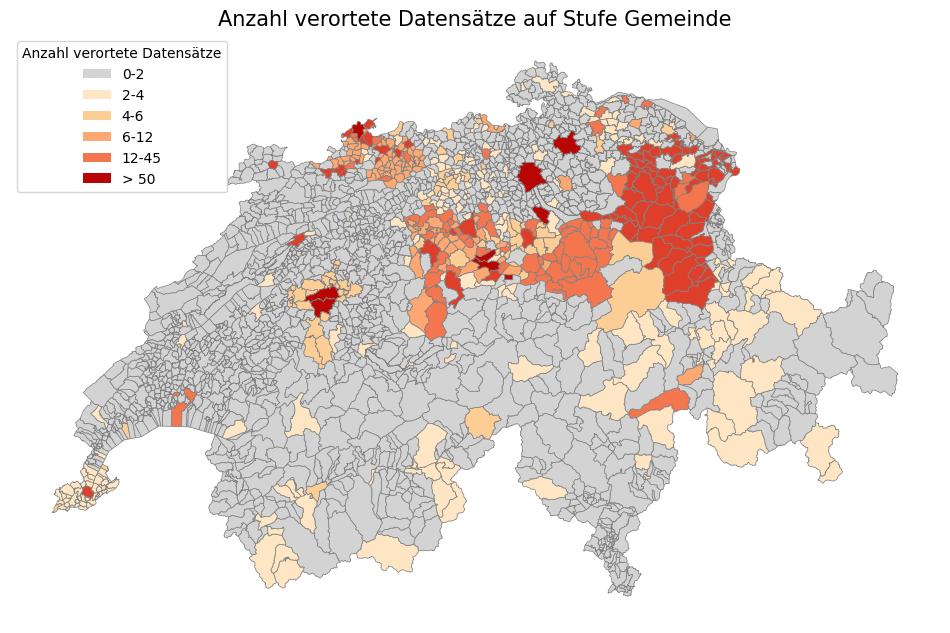

Final classes used in the map:
1. No data
2. (0.999, 2.0]
3. (2.0, 4.0]
4. (4.0, 6.0]
5. (6.0, 12.0]
6. (12.0, 45.0]
7. > 50


In [27]:
import pandas as pd
import geopandas as gpd
import psycopg2
import json
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
import seaborn as sns

# --- Load DB config ---
with open(r"C:\FHNW_lokal\6000\4M\01_ETL\21_load\db_config.json") as f:
    config = json.load(f)

# --- Load location counts from DB ---
query = """
SELECT dataset_location, COUNT(*) AS count
FROM merged_dataset_metadata
WHERE dataset_location IS NOT NULL
GROUP BY dataset_location
"""

conn = psycopg2.connect(
    database="4M",
    user=config["user"],
    password=config["password"],
    host=config["host"],
    port=config["port"]
)

df_locations = pd.read_sql(query, conn)
conn.close()

# --- Load GPKG geometries ---
gpkg_path = "04_Map/swissBOUNDARIES3D_1_5_LV95_LN02.gpkg"
layer_name = "tlm_hoheitsgebiet"
gdf = gpd.read_file(gpkg_path, layer=layer_name)

# --- Inspect columns of the GeoDataFrame ---
print("Columns in GeoDataFrame:")
print(gdf.columns)

# --- Assuming the correct column name for location is found (e.g., 'name') ---
# Replace 'name' with the correct column name after inspecting gdf.columns
gdf = gdf.merge(df_locations, left_on="name", right_on="dataset_location", how="left")

# --- Classify dataset counts ---
gdf["class"] = "No data"
nonzero_mask = gdf["count"] > 0
under_50_mask = (gdf["count"] > 0) & (gdf["count"] <= 50)
over_50_mask = gdf["count"] > 50

# --- Use qcut and extract bins ---
qcut_result = pd.qcut(
    gdf.loc[under_50_mask, "count"],
    q=6,
    duplicates="drop"
)
gdf.loc[under_50_mask, "class"] = qcut_result
ordered_bins = qcut_result.cat.categories.tolist()

# --- Group all counts > 50 ---
gdf.loc[over_50_mask, "class"] = "> 50"

# --- Define ordered class labels ---
classes = ["No data"] + [str(b) for b in ordered_bins] + ["> 50"]

# --- Assign colors: gray + OrRd ---
reds = sns.color_palette("OrRd", len(classes) - 1).as_hex()
colors = ["lightgray"] + reds

# --- Map class → index for color rendering ---
class_to_index = {cls: i for i, cls in enumerate(classes)}
gdf["class_index"] = gdf["class"].astype(str).map(class_to_index)

# --- Plot map ---
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
gdf.plot(
    column="class_index",
    cmap=ListedColormap(colors),
    linewidth=0.5,
    edgecolor="grey",
    ax=ax
)

# --- Custom legend with integer ranges ---
legend_patches = [
    Patch(facecolor=colors[i], label=f"{int(ordered_bins[i].left)}-{int(ordered_bins[i].right)}") 
    for i in range(len(ordered_bins))
]

# Adding the >50 category
legend_patches.append(Patch(facecolor=colors[-1], label="> 50"))

# Add the legend in the upper left corner
ax.legend(handles=legend_patches, title="Anzahl verortete Datensätze", loc="upper left")

ax.set_title("Anzahl verortete Datensätze auf Stufe Gemeinde", fontsize=15)
ax.axis("off")
plt.show()

# --- Print class labels ---
print("Final classes used in the map:")
for i, cls in enumerate(classes):
    print(f"{i+1}. {cls}")



In [7]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
import seaborn as sns

# --- Create class column ---
gdf["class"] = "No data"
nonzero_mask = gdf["count"] > 0
gdf.loc[nonzero_mask, "class"] = pd.qcut(
    gdf.loc[nonzero_mask, "count"],
    q=7,
    duplicates="drop"
)

# --- Create colors: blue for "No data", OrRd for quantiles ---
reds = sns.color_palette("OrRd", 7).as_hex()
colors = ["blue"] + reds
classes = ["No data"] + sorted(gdf.loc[nonzero_mask, "class"].astype(str).unique().tolist())

# --- Map classes to color indices ---
class_to_index = {cls: i for i, cls in enumerate(classes)}
gdf["class_index"] = gdf["class"].astype(str).map(class_to_index)

# --- Plot without colorbar ---
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
gdf.plot(
    column="class_index",
    cmap=ListedColormap(colors),
    linewidth=0.5,
    edgecolor="grey",
    ax=ax
)

# --- Custom legend only ---
legend_patches = [Patch(facecolor=colors[i], label=cls) for i, cls in enumerate(classes)]
ax.legend(handles=legend_patches, title="Dataset Count Classes", loc="lower left")

ax.set_title("📍 Dataset count classes per location (7 classes + No data)", fontsize=15)
ax.axis("off")
plt.show()


KeyError: 'count'

c:\Users\fabia\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


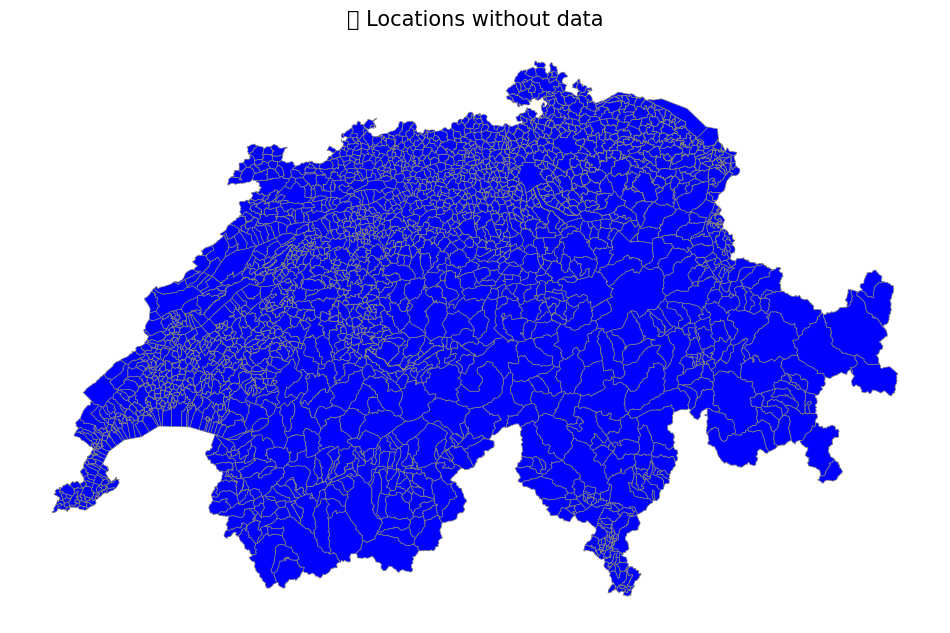

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
gdf[gdf["class"] == "No data"].plot(
    color="blue",
    linewidth=0.5,
    edgecolor="grey",
    ax=ax
)

ax.set_title("📍 Locations without data", fontsize=15)
ax.axis("off")
plt.show()


In [2]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
import seaborn as sns
import numpy as np

# --- Classify dataset counts ---
gdf["class"] = "No data"
nonzero_mask = gdf["count"] > 0
under_50_mask = (gdf["count"] > 0) & (gdf["count"] <= 50)
over_50_mask = gdf["count"] > 50

# --- Use qcut and extract bins
qcut_result = pd.qcut(
    gdf.loc[under_50_mask, "count"],
    q=6,
    duplicates="drop"
)
gdf.loc[under_50_mask, "class"] = qcut_result
ordered_bins = qcut_result.cat.categories.tolist()  # ← FIX: get categories from the qcut result

# --- Group all counts > 50
gdf.loc[over_50_mask, "class"] = "> 50"

# --- Define ordered class labels
classes = ["No data"] + [str(b) for b in ordered_bins] + ["> 50"]

# --- Assign colors: gray + OrRd
reds = sns.color_palette("OrRd", len(classes) - 1).as_hex()
colors = ["lightgray"] + reds

# --- Map class → index for color rendering
class_to_index = {cls: i for i, cls in enumerate(classes)}
gdf["class_index"] = gdf["class"].astype(str).map(class_to_index)

# --- Plot map ---
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
gdf.plot(
    column="class_index",
    cmap=ListedColormap(colors),
    linewidth=0.5,
    edgecolor="grey",
    ax=ax
)

# --- Custom legend ---
legend_patches = [Patch(facecolor=colors[i], label=cls) for i, cls in enumerate(classes)]
ax.legend(handles=legend_patches, title="Dataset Count Classes", loc="lower left")

ax.set_title("📍 Dataset counts per location (custom binning: >50 grouped)", fontsize=15)
ax.axis("off")
plt.show()

# --- Print class labels
print("📦 Final classes used in the map:")
for i, cls in enumerate(classes):
    print(f"{i+1}. {cls}")


KeyError: 'count'

In [53]:
import folium
from folium import GeoJsonTooltip
from matplotlib.colors import ListedColormap

# --- Drop duplicate columns to avoid folium errors ---
gdf = gdf.loc[:, ~gdf.columns.duplicated()]

# --- Fix: Convert datetime columns to strings ---
for col in gdf.select_dtypes(include=["datetime64[ns]"]).columns:
    gdf[col] = gdf[col].astype(str)

# Convert Interval objects to strings for JSON serialization
gdf["class"] = gdf["class"].astype(str)

# Then convert to Web CRS
gdf_wgs84 = gdf.to_crs(epsg=4326)


# --- Now convert to WGS84 ---
gdf_wgs84 = gdf.to_crs(epsg=4326)


# --- Define color mapping based on classes ---
class_color_map = {cls: color for cls, color in zip(classes, colors)}

# --- Folium style function using class colors ---
def style_function(feature):
    cls = feature["properties"].get("class", "No data")
    return {
        "fillOpacity": 0.7,
        "weight": 0.5,
        "color": "grey",
        "fillColor": class_color_map.get(cls, "lightgray")
    }

# --- Tooltip: show selected fields on hover ---
tooltip = GeoJsonTooltip(
    fields=["name", "count", "class"],
    aliases=["Gemeinde", "Dataset Count", "Class"],
    localize=True
)

# --- Create folium map centered on Switzerland ---
m = folium.Map(location=[46.8, 8.3], zoom_start=8, tiles="cartodbpositron")

# --- Add GeoJSON layer ---
folium.GeoJson(
    gdf_wgs84,
    tooltip=tooltip,
    style_function=style_function,
    name="Dataset Distribution"
).add_to(m)

folium.LayerControl().add_to(m)
m


KeyError: 'class'

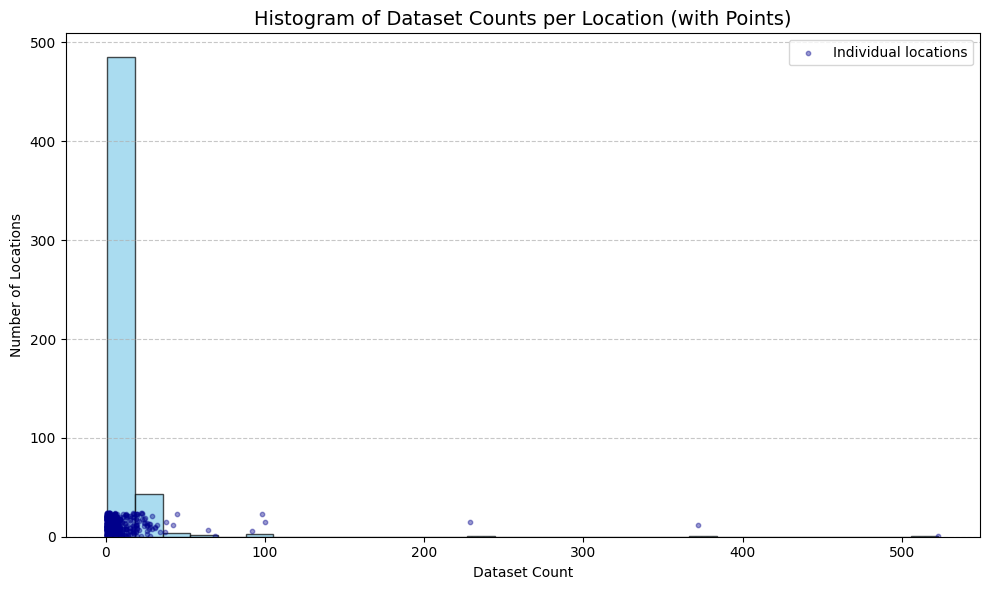

In [37]:
import matplotlib.pyplot as plt
import numpy as np

# Filter to only show locations with data (optional)
data = gdf[gdf["count"] > 0]["count"]

# --- Plot histogram ---
fig, ax = plt.subplots(figsize=(10, 6))
counts, bins, patches = ax.hist(data, bins=30, color="skyblue", edgecolor="black", alpha=0.7)

# --- Overlay points (dot strip plot) ---
# Map each value to a random y-position below the histogram for visibility
x = data.values
y = np.random.uniform(0, counts.max() * 0.05, size=len(x))  # jitter on y-axis

ax.scatter(x, y, color="darkblue", alpha=0.4, s=10, label="Individual locations")

# --- Labels and style ---
ax.set_title("Histogram of Dataset Counts per Location (with Points)", fontsize=14)
ax.set_xlabel("Dataset Count")
ax.set_ylabel("Number of Locations")
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.legend()
plt.tight_layout()
plt.show()


In [58]:
import pandas as pd
import geopandas as gpd
import psycopg2
import json
import folium
from folium import GeoJsonTooltip
from matplotlib import cm
from matplotlib.colors import to_hex
import matplotlib.pyplot as plt

try:
    # --- Load DB config ---
    with open(r"C:\FHNW_lokal\6000\4M\01_ETL\21_load\db_config.json") as f:
        config = json.load(f)

    # --- Query dataset counts from DB ---
    query = """
    SELECT dataset_location, COUNT(*) AS count
    FROM merged_dataset_metadata
    WHERE dataset_location IS NOT NULL
    GROUP BY dataset_location
    """

    conn = psycopg2.connect(
        database="4M",
        user=config["user"],
        password=config["password"],
        host=config["host"],
        port=config["port"]
    )
    df_locations = pd.read_sql(query, conn)
    conn.close()
    print(f"✅ Loaded {len(df_locations)} dataset locations from DB")

    # --- Load canton geometries (tlm_kantonsgebiet) ---
    gpkg_path = "04_Map/swissBOUNDARIES3D_1_5_LV95_LN02.gpkg"
    layer_name = "tlm_kantonsgebiet"
    gdf_cantons = gpd.read_file(gpkg_path, layer=layer_name)

    # --- Filter valid cantons (icc == 'CH') ---
    gdf_cantons = gdf_cantons[gdf_cantons["icc"] == "CH"]

    # --- Group dataset counts by kantonsnummer ---
    gdf_cantons["kantonsnummer"] = gdf_cantons["kantonsnummer"].astype(str).str.zfill(2)
    df_locations["dataset_location"] = df_locations["dataset_location"].astype(str).str.zfill(2)

    df_canton_counts = df_locations.groupby("dataset_location")["count"].sum().reset_index()
    df_canton_counts.rename(columns={"dataset_location": "kantonsnummer"}, inplace=True)

    # --- Merge counts to canton geometries ---
    gdf_cantons = gdf_cantons.merge(df_canton_counts, on="kantonsnummer", how="left")
    gdf_cantons["count"] = gdf_cantons["count"].fillna(0).astype(int)

    # --- Convert CRS for Folium ---
    gdf_cantons = gdf_cantons.loc[:, ~gdf_cantons.columns.duplicated()]
    gdf_cantons = gdf_cantons.drop(columns=gdf_cantons.select_dtypes(include=['datetime64[ns]']), errors='ignore')
    gdf_cantons["count_str"] = gdf_cantons["count"].astype(str)
    gdf_wgs = gdf_cantons.to_crs(epsg=4326)

    # --- Create color scale ---
    norm = plt.Normalize(vmin=gdf_wgs["count"].min(), vmax=gdf_wgs["count"].max())
    gdf_wgs["fill_color"] = gdf_wgs["count"].apply(lambda x: to_hex(cm.OrRd(norm(x))))

    # --- Create Folium map ---
    m = folium.Map(location=[46.8, 8.3], zoom_start=8, tiles="cartodbpositron")

    folium.GeoJson(
        gdf_wgs,
        style_function=lambda feature: {
            "fillColor": feature["properties"]["fill_color"],
            "color": "black",
            "weight": 1,
            "fillOpacity": 0.7
        },
        tooltip=GeoJsonTooltip(
            fields=["name", "count"],
            aliases=["Kanton", "Dataset Count"],
            localize=True
        ),
        name="Canton Dataset Count"
    ).add_to(m)

    folium.LayerControl().add_to(m)
    m  # <- display map

except Exception as e:
    print("❌ Error:", e)


C:\Users\fabia\AppData\Roaming\Python\Python39\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


✅ Loaded 579 dataset locations from DB


In [59]:
m